In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import glob
import random
import pickle
import os
import copy
import imagesize
import sys
import pickle
from numba import jit
from pprint import pprint
from IPython.display import display 

from utils import *
from model import *
from image_transform import *

import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
import ttach as tta
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from warmup_scheduler import GradualWarmupScheduler

plt.style.use("seaborn")


In [2]:
# 圖片處理設定:
clip   = (90, 90)  # (w, h)
scales = [2, 3, 4]

# GPU設定:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# 檔案路徑設定:
root = "C:\AI\Selected_Topics_in_Visual_Recognition_using_Deep_Learning\HW4_VDSR"

originHRPath          =  os.path.join(root, "origin_hr_images")
trainHRPath           =  os.path.join(root, "training_hr_images")
trainLRPaths          = [os.path.join(root, f"training_lr_images_{scale}x")        for scale in scales]
trainLROriginPaths    = [os.path.join(root, f"training_lr_images_{scale}x_origin") for scale in scales]
testSRPath            =  os.path.join(root, "testing_sr_images")
testLRPath            =  os.path.join(root, "testing_lr_images")
modelSavePath         =  os.path.join(root, "models")

originHRImgPaths = glob.glob(os.path.join(originHRPath, '*'))
testLRImgPaths  = glob.glob(os.path.join(testLRPath, '*'))


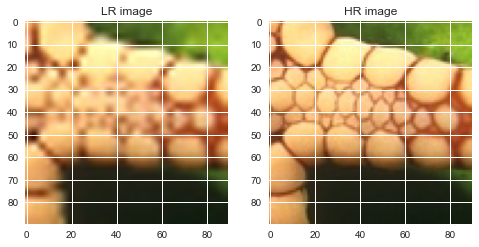

In [3]:
for i, scale in enumerate(scales):
    print(f"Dealing with scale {scale}x ...")
    trainHRImgPaths, trainLRImgPaths = CreateSubImages(originHRImgPaths, trainHRPath, trainLRPaths[i], 
                                                       clip, scale, True, True, True)
    print('\n' + '-'*50)

for i, scale in enumerate(scales):
    print(f"Dealing with scale {scale}x (origin images) ...")
    trainHRImgPaths, trainLRImgOriginPaths = CreateSubImages(originHRImgPaths, trainHRPath, trainLROriginPaths[i], 
                                                             clip, scale, False, False, True)
    print('\n' + '-'*50)

trainLRPath = trainLRPaths[1]
imgHR = plt.imread(os.path.join(trainHRPath, "12003_13.png"))
imgLR = plt.imread(os.path.join(trainLRPath, "12003_13.png"))

PlotHRLR(imgHR, imgLR, (8, 8))

In [4]:
def SaveModel(model, filename):
    modelFile = os.path.join(modelSavePath, filename)
    torch.save(model, modelFile)
    print(f" ... Save model at [{modelFile}] !")


def LoadModel(filename):
    modelFile = os.path.join(modelSavePath, filename)
    model = torch.load(modelFile)
    return model


def TrainOnBatch(model, dataLoader, optimzer, criterion, gradClip=None, useTTA=False):
    optimzer.zero_grad()
    
    # 把 tensors 傳到 GPU (or CPU):
    imgLRs, imgHRs = next(dataLoader)
    imgLRs, imgHRs = MixUp()(imgLRs, imgHRs, imgLRs, imgHRs)
    imgLRs = imgLRs.type(torch.FloatTensor).to(device)
    imgHRs = imgHRs.type(torch.FloatTensor).to(device)

    # 訓練模型:
    imgSRs = model(imgLRs)
    loss = criterion(imgSRs, imgHRs)
    loss.backward()
    if gradClip:
        if useTTA: 
            nn.utils.clip_grad_norm_(model.model.parameters(), gradClip)
        else:
            nn.utils.clip_grad_norm_(model.parameters(), gradClip)

    optimzer.step()

    return loss.item()


def Train(torchModel, epochs=50, batchSize=16, lr=0.1, gradClip=0.4, weightDecay=1e-5, device='cpu', showImg=False,
          interval=5, startEpoch=1, optimizer=0, scheduler=0, save=False, saveName='%d.pth'):

    global model, trainLRDSs, trainLDs

    # 圖片預處理 & 資料增強:
    transform = transforms.Compose([
        RGBToYCrBb(onlyY=True),
        transforms.ToTensor(),
        Rotate(angles=[0, 90, 180, 270])
    ])

    transformTTA = tta.Compose([
        tta.HorizontalFlip(),
        tta.VerticalFlip(),
    ])

    # 模型定義:
    if type(torchModel) is type:
        model = torchModel().to(device)
    elif type(torchModel) is str:
        model = LoadModel(torchModel).to(device)
    else:
        model = torchModel.to(device)
    
    modelTTA = tta.SegmentationTTAWrapper(model, transforms=transformTTA)

    # optimizer:
    if   optimizer == 0: optimizer = optim.SGD  (model.parameters(), lr=lr, weight_decay=weightDecay, momentum=0.9) 
    elif optimizer == 1: optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=weightDecay)
    else               : raise Exception(f"Don't support this optimizer: [{optimizer}] !")

    # 學習率 scheduler
    if   scheduler == 0: scheduler = optim.lr_scheduler.StepLR(optimizer, 20, 0.5)
    elif scheduler == 1: scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=5, eta_min=1e-10)
    else               : raise Exception(f"Don't support this scheduler: [{scheduler}] !")

    scheduler = GradualWarmupScheduler(optimizer, 1, 5, scheduler)

    # Loss function:
    criterion = nn.MSELoss(reduction='sum').to(device)

    # 資料集:
    trainLRDSs = []
    trainLDs   = []
    nScales = len(scales)
    for i in range(nScales):
        trainHRDS  = ImageDataset(trainHRPath    , transform)
        trainLRDS  = ImageDataset(trainLRPaths[i], transform)
        trainLD    = ImageLoader(trainLRDS, trainHRDS, batchSize=batchSize)
        trainLRDSs.append(trainLRDS)
        trainLDs.append(trainLD)

    # 訓練流程:
    startEpoch -= 1
    endEpoch = startEpoch + epochs
    numBatch = len(trainHRDS) // batchSize + 1
    for epoch in range(startEpoch, endEpoch):
        model.train()
        lossEpoch = 0.
        for i in range(numBatch):
            for j in range(len(scales)):
                loss = TrainOnBatch(modelTTA, trainLDs[j], optimizer, criterion, gradClip, True)
                lossEpoch += loss

            lossEpochAvg = lossEpoch / (i + 1)
            sys.stdout.write(f"\r|Epoch {epoch + 1}/{endEpoch}|Batch {i + 1}/{numBatch}| => MSE Loss = {round(lossEpochAvg, 4)}  ")
    
        scheduler.step()
        if (epoch - startEpoch + 1) % interval == 0:
            if save:
                SaveModel(model, saveName % (epoch + 1))

            if showImg:
                Test(model, 3, True, True, num=1)

        else:
            print(" ")

    return model, lossEpochAvg



def Test(torchModel, scale=3, plotResult=False, plotResidual=False, figsize=(18, 12), num=-1, stateDict={}, saveSR=False):

    # 模型讀取:
    if type(torchModel) is type:
        trainedModel = torchModel()
        trainedModel.load_state_dict(stateDict)
    else:
        trainedModel = torchModel

    # 圖片預處理:
    transform = transforms.Compose([
        RGBToYCrBb(onlyY=True),
        transforms.ToTensor()
    ])

    # 測試流程:
    with torch.no_grad():
        trainedModel.eval()
        for i, testLRImgPath in enumerate(testLRImgPaths):
            if num == 1:
                testLRImgPath = testLRImgPaths[11]

            if num == -1 or i < num:
                testImgLRInput = ReadImage(testLRImgPath)
                resize         = (testImgLRInput.shape[0] * scale, testImgLRInput.shape[1] * scale)
                testImgLRInput = cv2.resize(testImgLRInput, resize[::-1], interpolation=cv2.INTER_CUBIC)
                testImgLR = transform(testImgLRInput).unsqueeze(0).to(device)
                testImgSR = trainedModel(testImgLR)
                if plotResult:
                    testImgSR = GPUToNumpy(testImgSR, reduceDim=0)
                    testImgSR = YCrCbToRGB(resize=resize, originImgPath=testLRImgPath)(testImgSR)
                    PlotHRLR(testImgSR, testImgLRInput, figsize=figsize, plotResidual=plotResidual)
                
                if saveSR:
                    filename = os.path.join(testSRPath, os.path.basename(testLRImgPath))
                    print(f"Saved path: [{filename}]")
                    plt.imsave(filename, np.clip(testImgSR, 0, 1))


In [5]:
Train(VDSR, epochs=80, batchSize=8, lr=0.1, gradClip=0.4, weightDecay=1e-4, device=device, showImg=True,
          interval=5, startEpoch=1, optimizer=0, scheduler=0, save=True, saveName='%d.pth')

|Epoch 21/100|Batch 156/433| => MSE Loss = 9716398397177.436  

KeyboardInterrupt: 

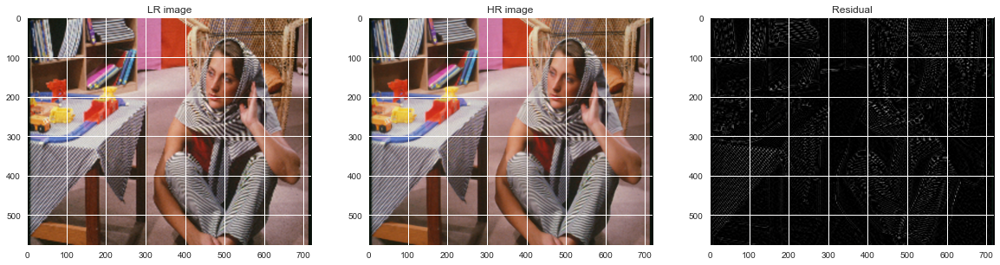

Saved path: [C:\AI\Selected_Topics_in_Visual_Recognition_using_Deep_Learning\HW4_VDSR\testing_sr_images\00.png]


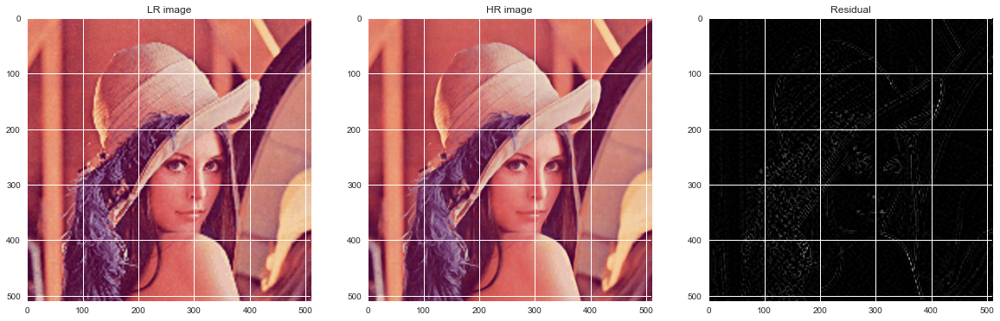

Saved path: [C:\AI\Selected_Topics_in_Visual_Recognition_using_Deep_Learning\HW4_VDSR\testing_sr_images\01.png]


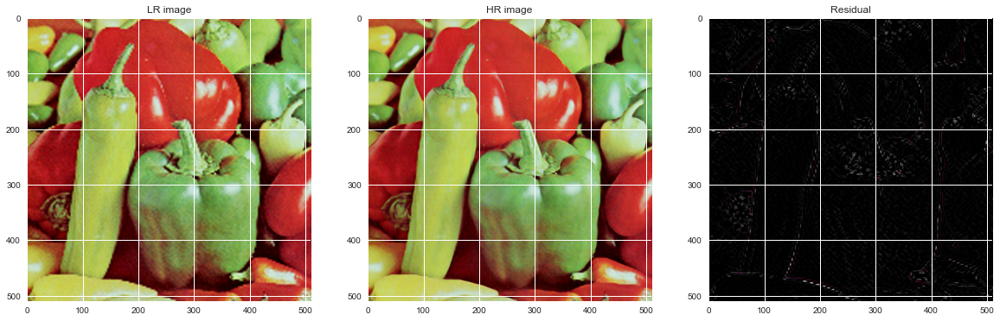

Saved path: [C:\AI\Selected_Topics_in_Visual_Recognition_using_Deep_Learning\HW4_VDSR\testing_sr_images\02.png]


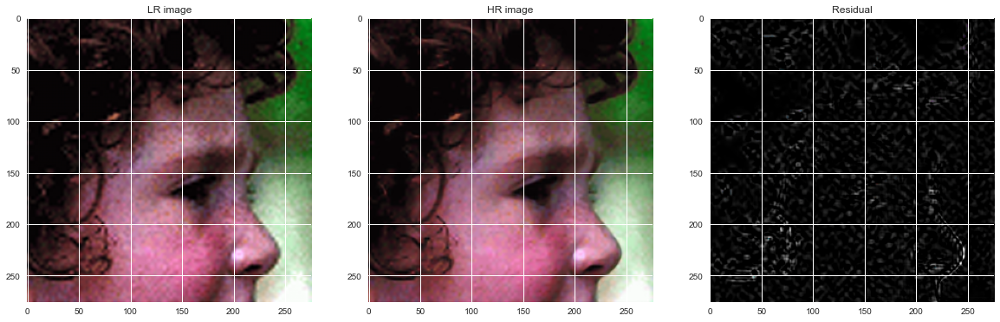

Saved path: [C:\AI\Selected_Topics_in_Visual_Recognition_using_Deep_Learning\HW4_VDSR\testing_sr_images\03.png]


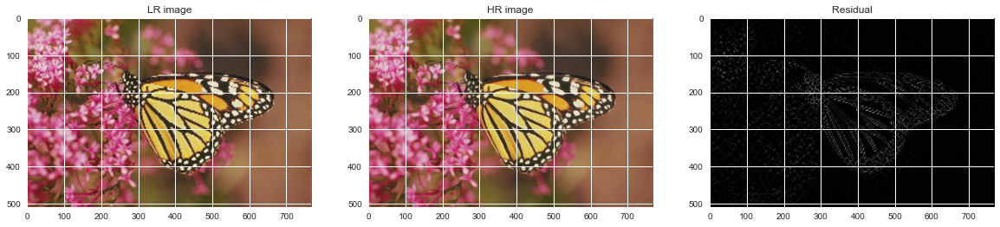

Saved path: [C:\AI\Selected_Topics_in_Visual_Recognition_using_Deep_Learning\HW4_VDSR\testing_sr_images\04.png]


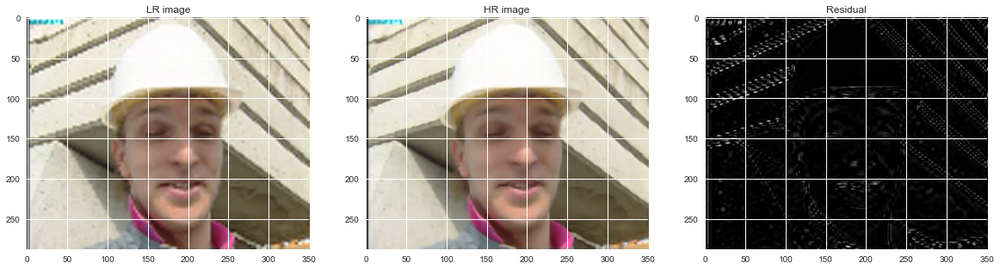

Saved path: [C:\AI\Selected_Topics_in_Visual_Recognition_using_Deep_Learning\HW4_VDSR\testing_sr_images\05.png]


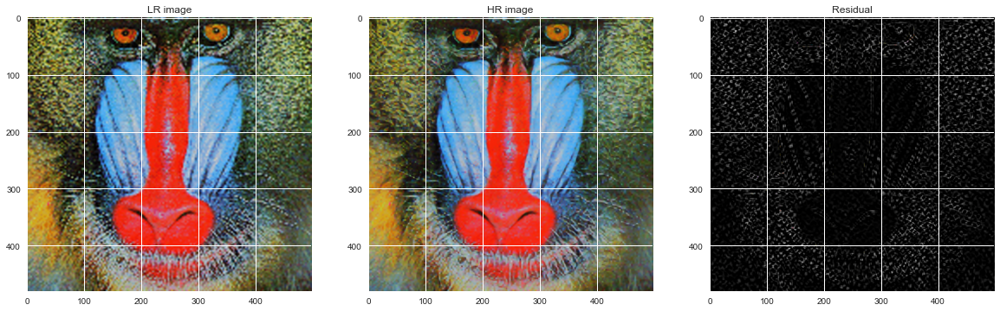

Saved path: [C:\AI\Selected_Topics_in_Visual_Recognition_using_Deep_Learning\HW4_VDSR\testing_sr_images\06.png]


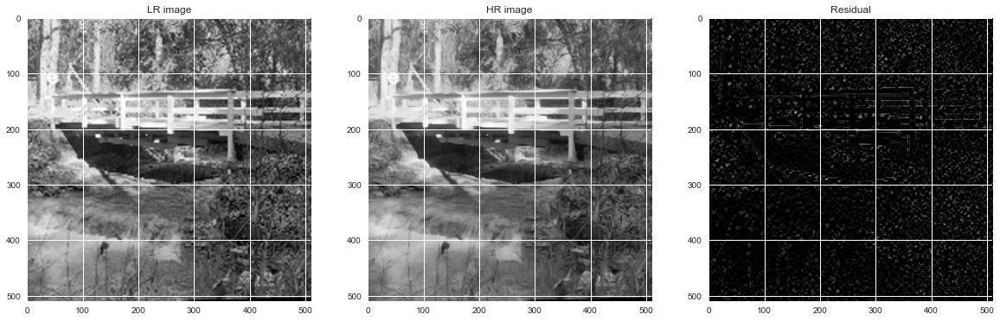

Saved path: [C:\AI\Selected_Topics_in_Visual_Recognition_using_Deep_Learning\HW4_VDSR\testing_sr_images\07.png]


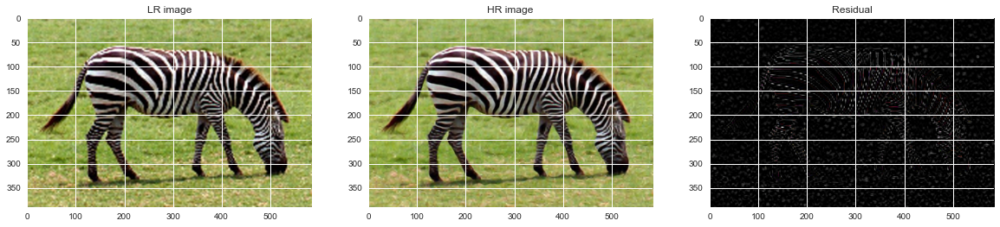

Saved path: [C:\AI\Selected_Topics_in_Visual_Recognition_using_Deep_Learning\HW4_VDSR\testing_sr_images\08.png]


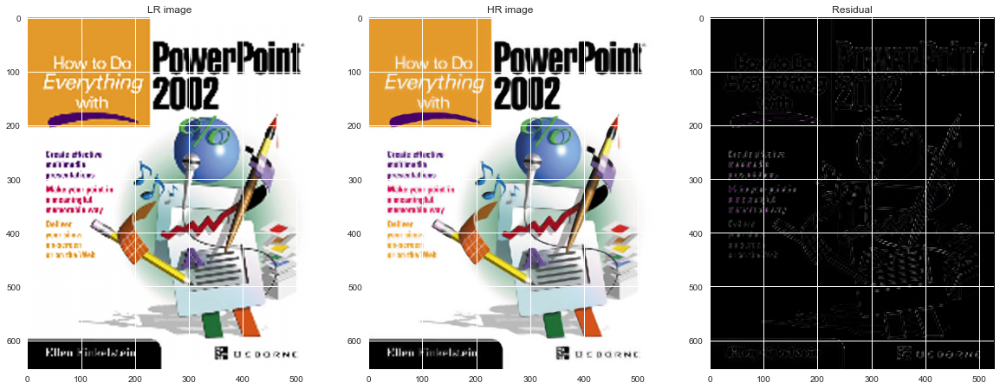

Saved path: [C:\AI\Selected_Topics_in_Visual_Recognition_using_Deep_Learning\HW4_VDSR\testing_sr_images\09.png]


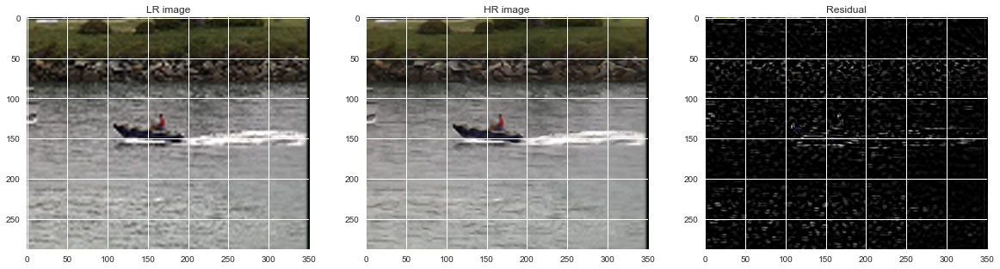

Saved path: [C:\AI\Selected_Topics_in_Visual_Recognition_using_Deep_Learning\HW4_VDSR\testing_sr_images\10.png]


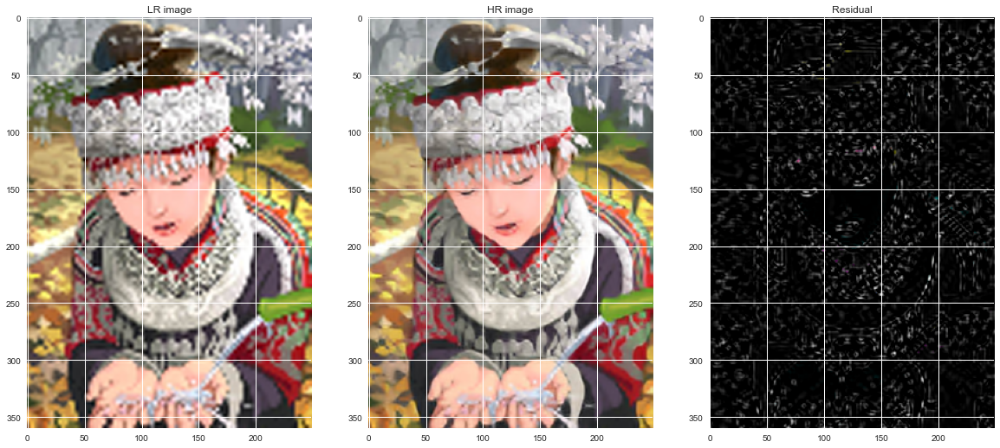

Saved path: [C:\AI\Selected_Topics_in_Visual_Recognition_using_Deep_Learning\HW4_VDSR\testing_sr_images\11.png]


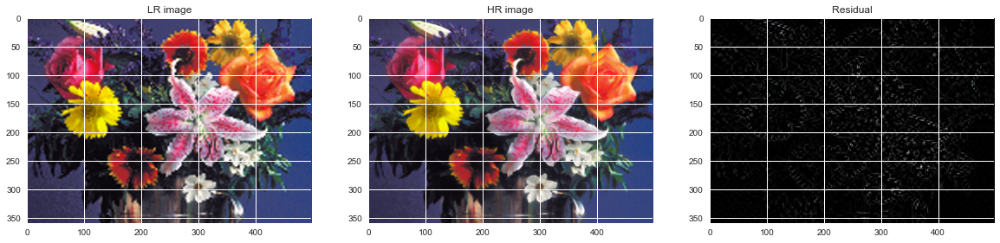

Saved path: [C:\AI\Selected_Topics_in_Visual_Recognition_using_Deep_Learning\HW4_VDSR\testing_sr_images\12.png]


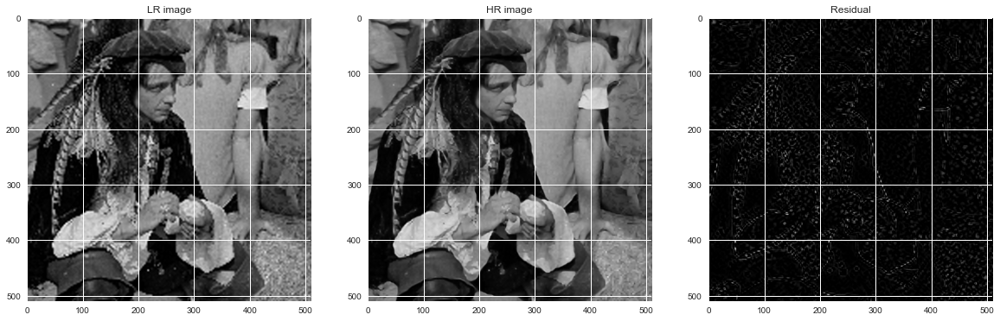

Saved path: [C:\AI\Selected_Topics_in_Visual_Recognition_using_Deep_Learning\HW4_VDSR\testing_sr_images\13.png]


In [10]:
trainedVDSR = LoadModel('20.pth')
Test(trainedVDSR, 3, plotResult=True, plotResidual=True, figsize=(20, 14), num=-1, saveSR=True)